In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

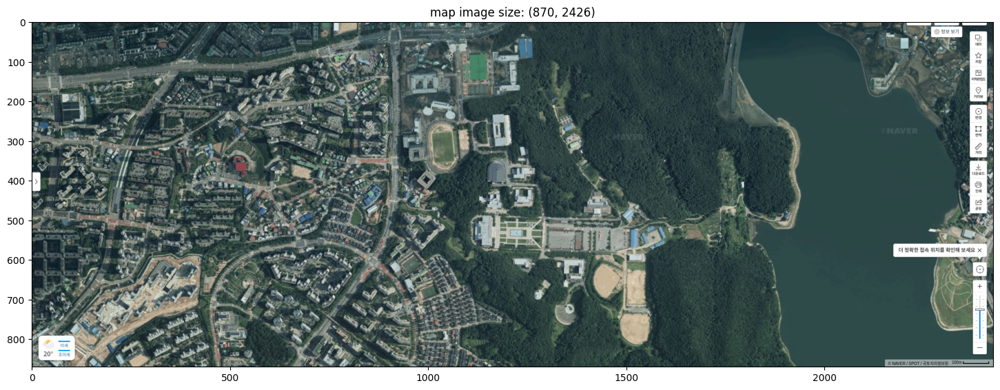

In [3]:
image_file = "/home/kodogyu/Datasets/sanhak_challenge/kyunghee_satelite_map_raw.png"

map_image_raw = cv2.imread(image_file, cv2.IMREAD_COLOR)

map_image_raw_rgb = cv2.cvtColor(map_image_raw, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18, 10))
plt.imshow(map_image_raw_rgb)
plt.title(f"map image size: {map_image_raw.shape[:2]}")
plt.show()

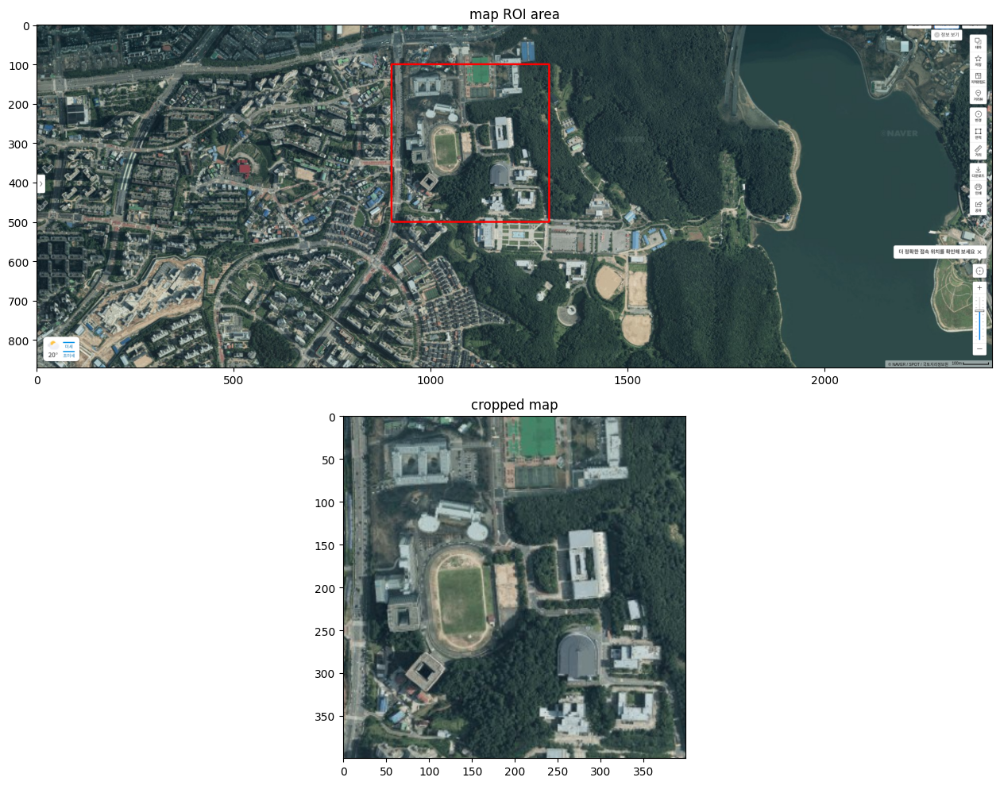

In [4]:
# map ROI
x = 900
y = 100
width = 400
height = 400

# crop map
cropped_map_rgb = map_image_raw_rgb[y:y+height, x:x+width]

# draw ROI rectangle
map_draw_roi = cv2.rectangle(map_image_raw_rgb.copy(), (x, y), (x+width, y+height), (255, 0, 0), 3)

# Plot
fig, axs = plt.subplots(2, 1, figsize=(18, 10))
axs[0].imshow(map_draw_roi)
axs[0].set_title("map ROI area")

axs[1].imshow(cropped_map_rgb)
axs[1].set_title("cropped map")

plt.tight_layout()
plt.show()

In [5]:
# 400x400 map
map_image = cropped_map_rgb.copy()
print(f"map_image shape: {map_image.shape}")

cropped_map_bgr = cv2.cvtColor(map_image, cv2.COLOR_RGB2BGR)
cv2.imwrite("/home/kodogyu/Datasets/sanhak_challenge/kyunghee_satelite_map_cropped.png", cropped_map_bgr)

map_image shape: (400, 400, 3)


True

In [6]:
# sample data shape
sample_width_output, sample_height_output = 50, 50

In [7]:
def get_sample_x_y_theta_s():
    sample_x = np.random.randint(0, map_image.shape[1])  # pixel
    sample_y = np.random.randint(0, map_image.shape[0])  # pixel
    sample_theta = (np.random.random() - 0.5)*2 * np.pi  # rad (min: -pi, max: pi)
    sample_s = np.random.random() * map_image.shape[0]/(sample_width_output) + 0.1  # scale, (min: 0.1, max: map_image.shape/sample_image.shape)

    # round floats
    sample_theta = np.round(sample_theta, 3)
    sample_s = np.round(sample_s, 3)

    return sample_x, sample_y, sample_theta, sample_s

In [8]:
sample_x, sample_y, sample_theta, sample_s = get_sample_x_y_theta_s()

print("sample_x:", sample_x)
print("sample_y:", sample_y)
print("sample_theta:", sample_theta)
print("sample_s:", sample_s)

sample_x: 192
sample_y: 39
sample_theta: 0.978
sample_s: 4.817


In [9]:
def affine_transform(rotation_matrix, map_image_shape, sample_xy, sample_raw_shape, sample_pixel):
    # input pixel : (x, y) format

    # translate sample patch
    sample_pixel_T = sample_pixel.T - np.array([sample_raw_shape[1]/2, sample_raw_shape[0]/2])
    sample_pixel = sample_pixel_T.T

    # rotate sample pixel
    map_pixel = rotation_matrix @ sample_pixel

    # translate map pixel
    map_pixel[0] += sample_xy[0]
    map_pixel[1] += sample_xy[1]

    # round float to int
    map_pixel = np.round(map_pixel).astype(np.int32)

    return map_pixel

In [10]:
def get_sample_data(sample_x, sample_y, sample_theta, sample_s, do_plot=True):
    print("sample values:", sample_x, sample_y, sample_theta, sample_s)

    sample_width_raw = round(sample_width_output * sample_s)
    sample_height_raw = round(sample_height_output * sample_s)
    # print(f"sample_width_raw: {sample_width_raw}")
    # print(f"sample_height_raw: {sample_height_raw}")

    rotation_mat = np.array([[np.cos(sample_theta), -np.sin(sample_theta)],
                            [np.sin(sample_theta),  np.cos(sample_theta)]])
    # print(f"sample_theta: {sample_theta}")
    # print("rotation matrix:", rotation_mat)

    # empty sample
    sample_raw = np.zeros((sample_height_raw, sample_width_raw, 3))
    sample_center = np.array([sample_x, sample_y])


    # Validation
    # sample data ROI
    top_left = np.array([0, 0])
    top_right = np.array([sample_width_raw, 0])
    bottom_left = np.array([0, sample_height_raw])
    bottom_right = np.array([sample_width_raw, sample_height_raw])

    sample_corners = np.vstack([top_left, top_right, bottom_left, bottom_right], dtype=np.float32)  # 4x2
    transformed_corners = affine_transform(rotation_mat, map_image.shape, sample_center, sample_raw.shape, sample_corners.T)  # 2x4

    print(transformed_corners.min(), transformed_corners.max())
    if transformed_corners.min() < 0 or transformed_corners.max() >= map_image.shape[0]:
        print("Invalid sample values...")
        return

    # fill sample data
    for sample_pixel_y in range(sample_height_raw):
        for sample_pixel_x in range(sample_width_raw):
            sample_pixel = np.array([sample_pixel_x, sample_pixel_y], dtype=np.float32)

            map_pixel = affine_transform(rotation_mat, map_image.shape, sample_center, sample_raw.shape, sample_pixel)

            # fill a sample pixel
            sample_raw[sample_pixel_y, sample_pixel_x] = map_image[map_pixel[1], map_pixel[0]]

    # resize
    sample_output = cv2.resize(sample_raw, (sample_height_output, sample_width_output))

    # typecast
    sample_raw = sample_raw.astype(np.uint8)
    sample_output = sample_output.astype(np.uint8)

    # Plot
    if do_plot:
        top_left, top_right, bottom_left, bottom_right = transformed_corners.T

        # arrow
        arrow_head = np.array([sample_width_raw//2, 0])
        arrow_head = affine_transform(rotation_mat, map_image.shape, sample_center, sample_raw.shape, arrow_head)

        # draw ROI box & arrow
        map_image_draw_sample = map_image.copy()
        cv2.line(map_image_draw_sample, top_left, top_right, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, top_right, bottom_right, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, bottom_right, bottom_left, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, bottom_left, top_left, (255, 0, 0), 2)
        cv2.arrowedLine(map_image_draw_sample, sample_center, arrow_head, (0, 255, 0), 2, tipLength=0.3)

        fig, axs = plt.subplots(1, 3, figsize=(15, 10))
        axs[0].imshow(map_image_draw_sample.astype(np.uint8))
        axs[0].set_title("map image with sample data roi")

        axs[1].imshow(sample_raw)
        axs[1].set_title(f"sample data. x: {sample_x}, y: {sample_y}, theta: {sample_theta}, s: {sample_s}")

        axs[2].imshow(sample_output)
        axs[2].set_title(f"sample output. shape: {sample_output.shape}")

        plt.tight_layout()
        plt.show()

    return sample_output

sample values: 150 200 -1.1 2.3
73 277


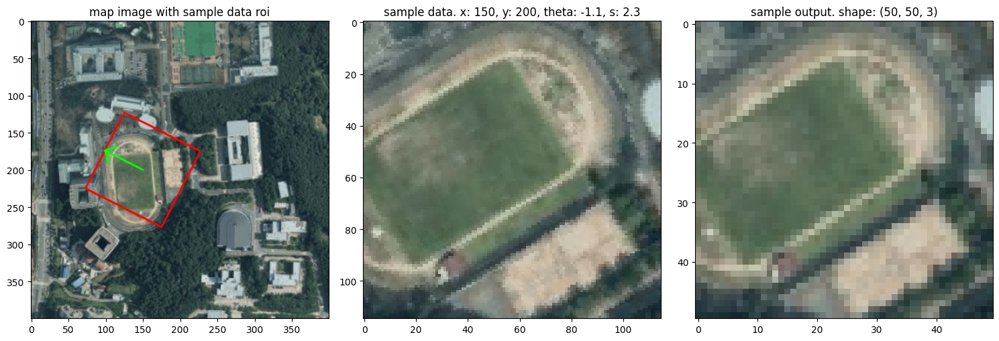

In [12]:
# Test
sample_x = 150
sample_y = 200
sample_theta = -1.1
sample_s = 2.3

sample_output = get_sample_data(sample_x, sample_y, sample_theta, sample_s, True)

## Make samples

In [53]:
dataset_path = "/home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/train"
# dataset_path = "/home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/test"

dataset_quantity = 10000
sample_cnt = 0

while sample_cnt < dataset_quantity:
    sample_x, sample_y, sample_theta, sample_s = get_sample_x_y_theta_s()
    sample_output = get_sample_data(sample_x, sample_y, sample_theta, sample_s, False)

    if sample_output is None:
        continue

    file_name = f"{sample_cnt}_{sample_x}_{sample_y}_{sample_theta}_{sample_s}.png"
    sample_output_bgr = cv2.cvtColor(sample_output, cv2.COLOR_RGB2BGR)
    write_success = cv2.imwrite(os.path.join(dataset_path, file_name), sample_output_bgr)

    print(sample_cnt, write_success)

    if write_success:
        sample_cnt += 1


sample values: 39 204 -2.377 7.63
-231 474
Invalid sample values...
sample values: 122 153 1.792 2.239
55 220
0 True
sample values: 84 120 2.819 2.653
0 204
1 True
sample values: 172 77 3.083 5.198
-60 309
Invalid sample values...
sample values: 272 341 -0.862 7.794
-3 616
Invalid sample values...
sample values: 231 305 -2.241 5.162
50 486
Invalid sample values...
sample values: 253 364 1.895 0.687
231 386
2 True
sample values: 144 379 -0.831 2.346
61 462
Invalid sample values...
sample values: 118 42 -1.087 4.093
-96 256
Invalid sample values...
sample values: 362 370 -1.997 7.462
115 617
Invalid sample values...
sample values: 158 172 2.225 5.17
-23 353
Invalid sample values...
sample values: 339 33 1.622 6.402
-135 507
Invalid sample values...
sample values: 139 98 1.254 5.308
-69 306
Invalid sample values...
sample values: 177 305 -1.718 6.953
-21 503
Invalid sample values...
sample values: 80 147 0.084 7.291
-117 344
Invalid sample values...
sample values: 311 70 -2.4 6.607
-163 5

## Read samples

In [252]:
def plot_sample_data(sample_x, sample_y, sample_theta, sample_s, sample, sample_file_name, do_plot=True):

    sample_width_raw = round(sample_width_output * sample_s)
    sample_height_raw = round(sample_height_output * sample_s)

    rotation_mat = np.array([[np.cos(sample_theta), -np.sin(sample_theta)],
                            [np.sin(sample_theta),  np.cos(sample_theta)]])

    # empty sample
    sample_raw = np.zeros((sample_height_raw, sample_width_raw, 3))
    sample_center = np.array([sample_x, sample_y])


    # Validation
    # sample data ROI
    top_left = np.array([0, 0])
    top_right = np.array([sample_width_raw, 0])
    bottom_left = np.array([0, sample_height_raw])
    bottom_right = np.array([sample_width_raw, sample_height_raw])

    sample_corners = np.vstack([top_left, top_right, bottom_left, bottom_right], dtype=np.float32)  # 4x2
    transformed_corners = affine_transform(rotation_mat, map_image.shape, sample_center, sample_raw.shape, sample_corners.T)  # 2x4

    if transformed_corners.min() < 0 or transformed_corners.max() > map_image.shape[0]:
        print("Invalid sample values...")
        return

    # Plot
    if do_plot:
        top_left, top_right, bottom_left, bottom_right = transformed_corners.T

        # arrow
        arrow_head = np.array([sample_width_raw//2, 0])
        arrow_head = affine_transform(rotation_mat, map_image.shape, sample_center, sample_raw.shape, arrow_head)

        # draw ROI box & arrow
        map_image_draw_sample = map_image.copy()
        cv2.line(map_image_draw_sample, top_left, top_right, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, top_right, bottom_right, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, bottom_right, bottom_left, (255, 0, 0), 2)
        cv2.line(map_image_draw_sample, bottom_left, top_left, (255, 0, 0), 2)
        cv2.arrowedLine(map_image_draw_sample, sample_center, arrow_head, (0, 255, 0), 2, tipLength=0.3)

        fig, axs = plt.subplots(1, 2, figsize=(10,10))
        axs[0].imshow(map_image_draw_sample.astype(np.uint8))
        axs[0].set_title("map image with sample data roi")

        axs[1].imshow(sample)
        axs[1].set_title(sample_file_name)

        plt.tight_layout()
        plt.show()

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/0_74_354_2.942_1.145.png
sample values: 0 74 354 2.942 1.145


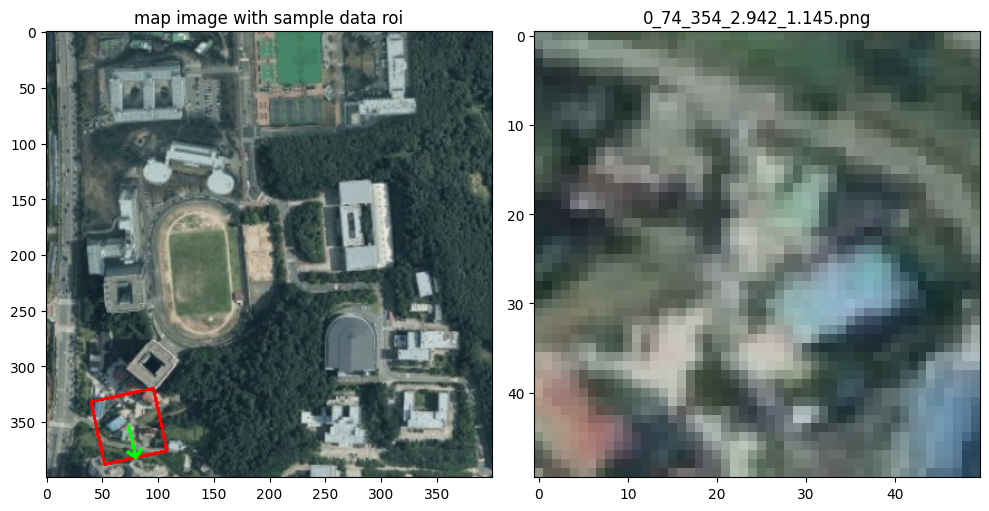

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1000_159_94_0.504_2.175.png
sample values: 1000 159 94 0.504 2.175


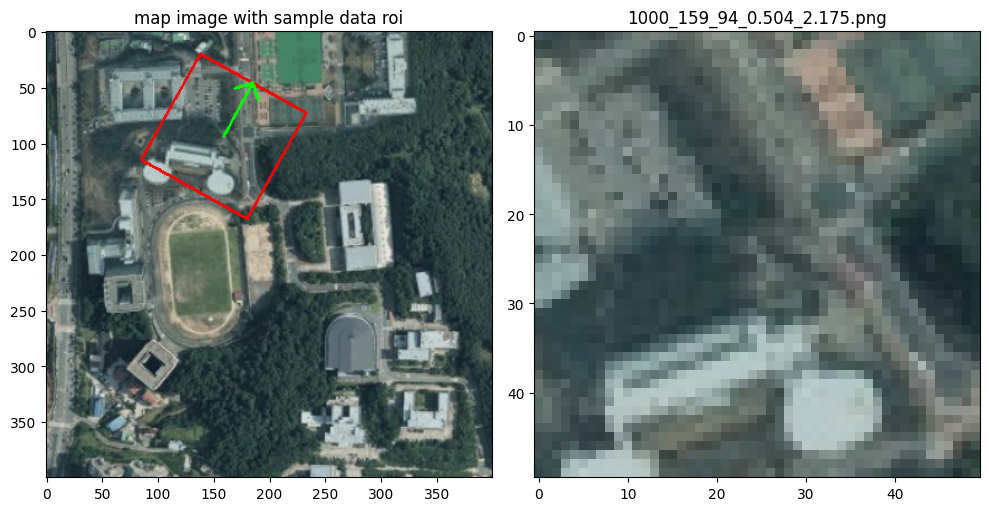

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1001_103_86_0.878_1.25.png
sample values: 1001 103 86 0.878 1.25


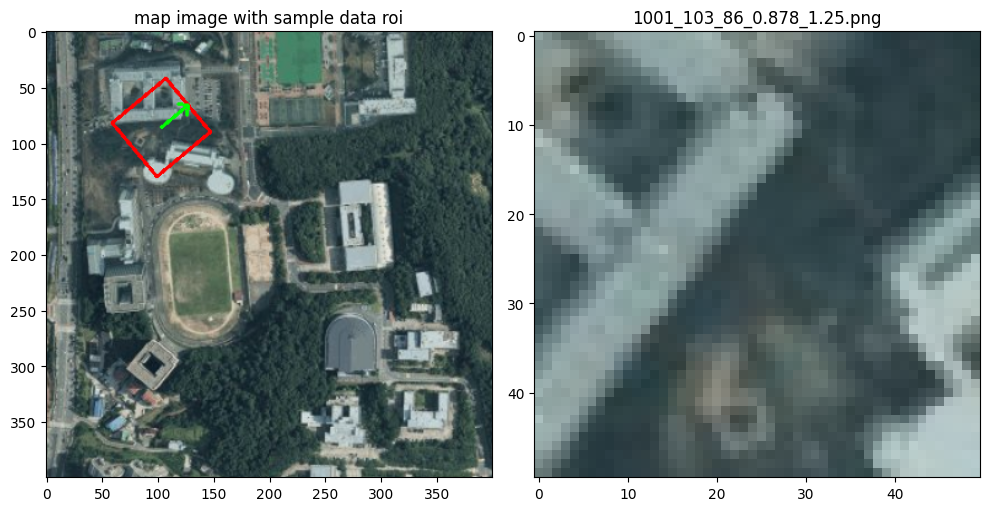

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1002_132_244_2.374_0.781.png
sample values: 1002 132 244 2.374 0.781


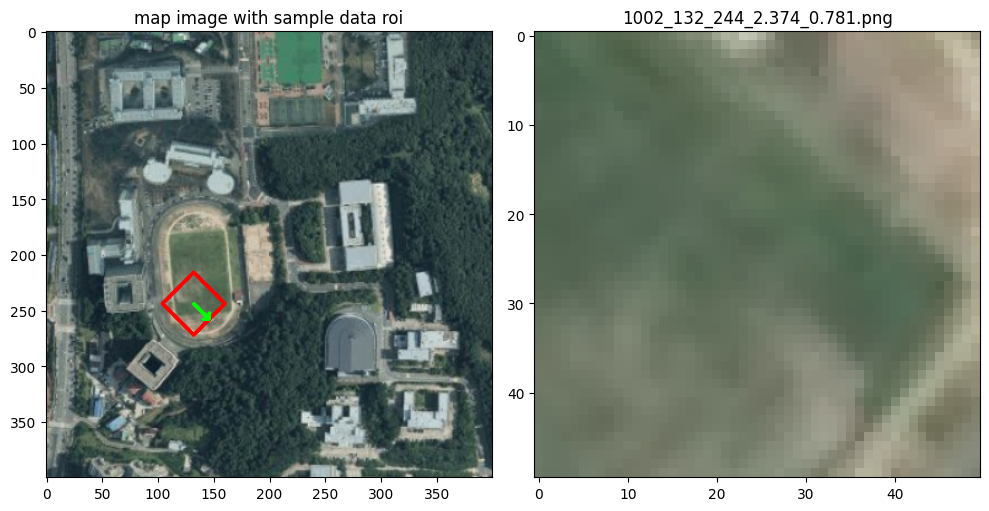

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1003_234_229_-1.697_3.485.png
sample values: 1003 234 229 -1.697 3.485


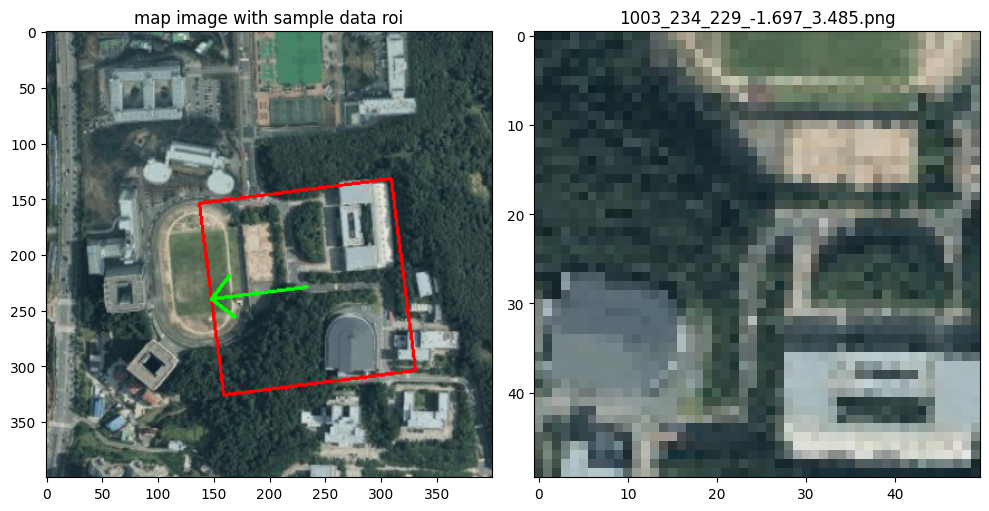

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1004_208_210_0.412_2.504.png
sample values: 1004 208 210 0.412 2.504


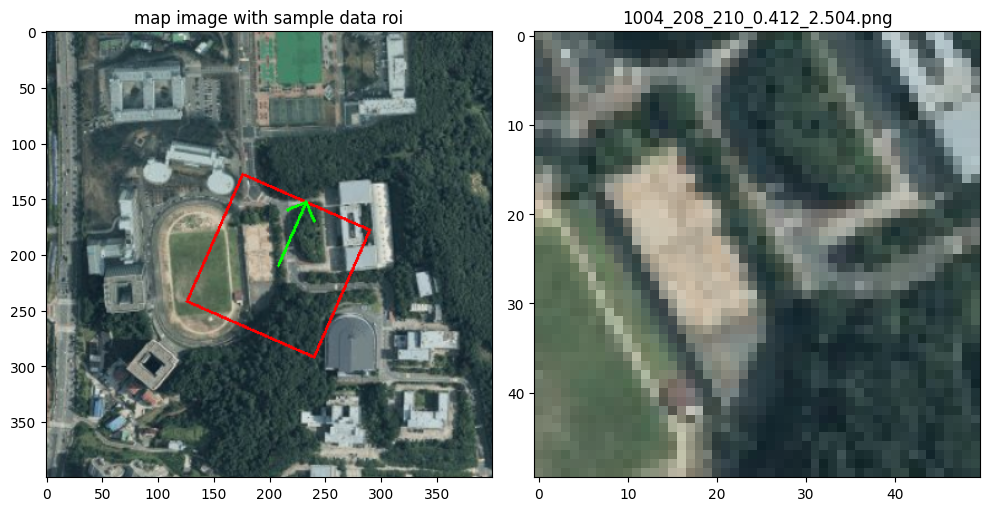

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1005_68_167_-1.559_2.078.png
sample values: 1005 68 167 -1.559 2.078


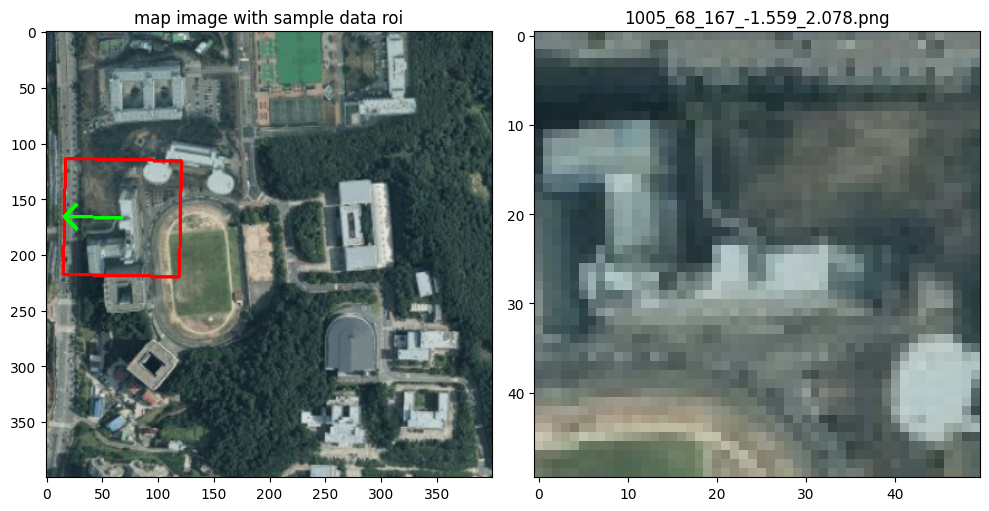

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1006_311_333_-1.355_2.141.png
sample values: 1006 311 333 -1.355 2.141


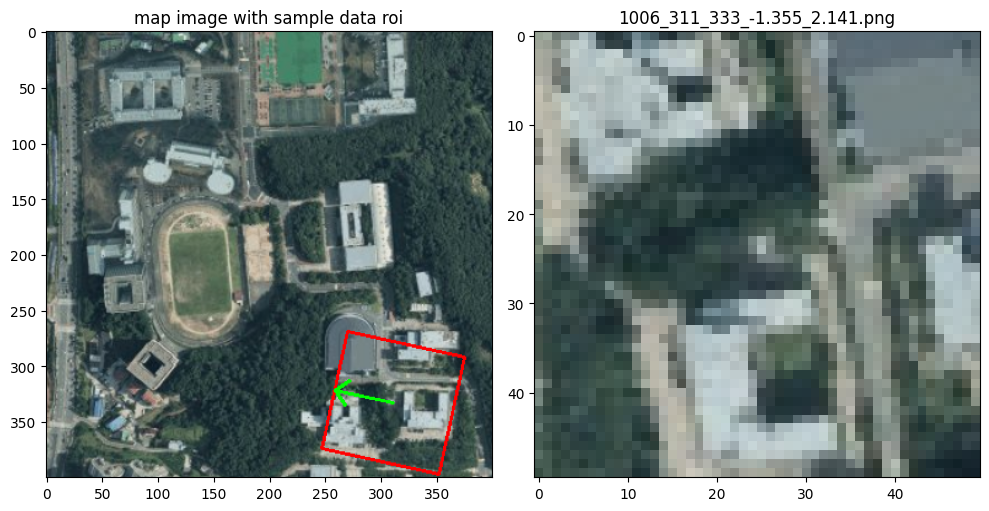

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1007_115_258_2.866_3.484.png
sample values: 1007 115 258 2.866 3.484


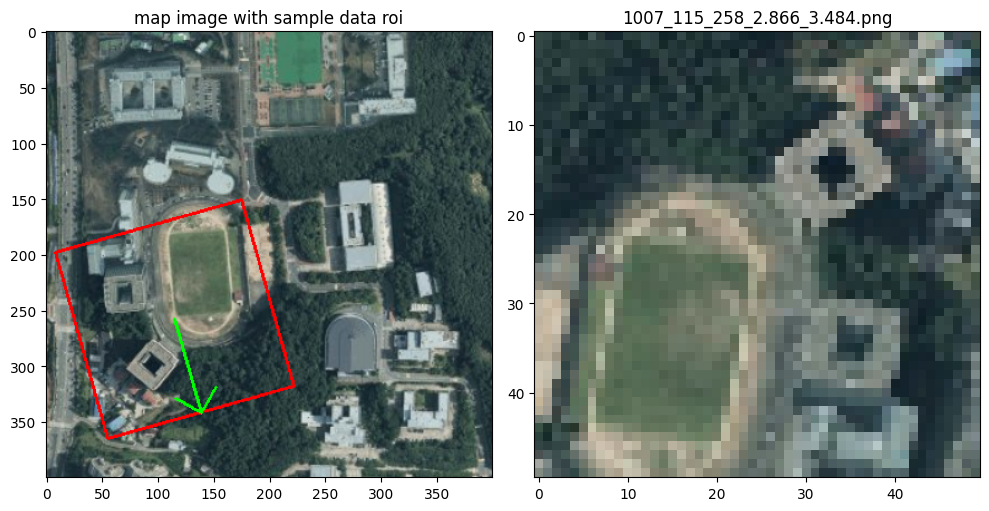

file name: /home/kodogyu/Datasets/sanhak_challenge/kyunghee_BEV/1008_111_214_-2.248_0.407.png
sample values: 1008 111 214 -2.248 0.407


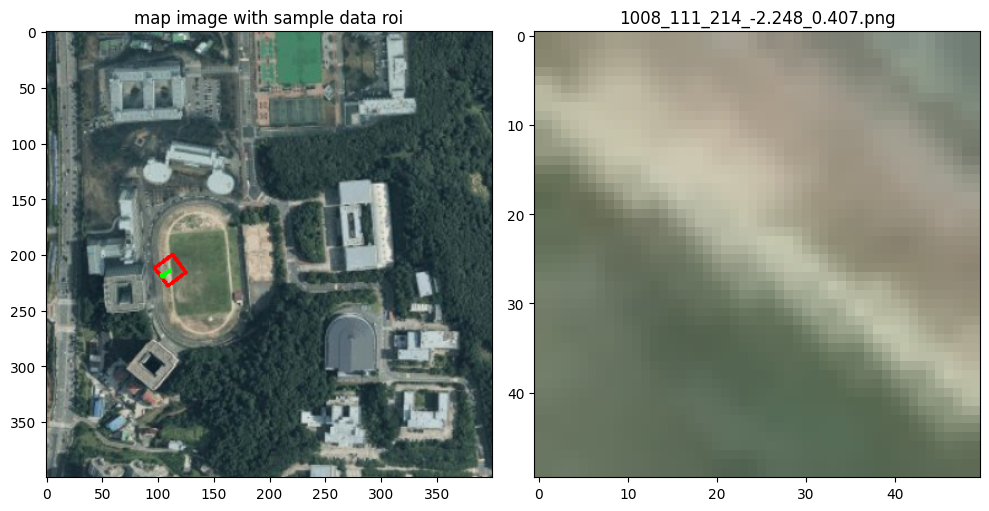

In [253]:
data_files = glob.glob(dataset_path + '*.png')

data_files.sort()

for read_sample_name in data_files[:10]:
    print("file name:", read_sample_name)

    sample = cv2.imread(read_sample_name, cv2.IMREAD_COLOR)
    sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)

    sample_values = read_sample_name.split('/')[-1][:-4].split('_')

    idx, x, y = list(map(int, sample_values[:3]))
    theta, s = list(map(float, sample_values[3:]))

    print("sample values:", idx, x, y, theta, s)

    plot_sample_data(x, y, theta, s, sample, True)